In [2]:
import pandas as pd
import numpy as np
from sklearn import preprocessing
import csv
import statsmodels.api as sm
from scipy import stats
import networkx as nx

In [202]:
file = pd.read_excel('originalData2.xlsx')

In [203]:
file.head()

,Week,Closing Price (USD),bitcoin: (Worldwide),price,google,diff,diff**2
0,2014-05-04,438.29035,2,0.012793,0.000000,1,1
1,2014-05-11,449.74166,2,0.013396,0.000000,1,1
2,2014-05-18,445.15666,2,0.013155,0.000000,1,1
3,2014-05-25,533.92999,3,0.017834,0.010204,1,1
4,2014-06-01,638.16333,3,0.023328,0.010204,1,1


In [204]:
file.keys()

Index(['Week', 'Closing Price (USD)', 'bitcoin: (Worldwide)', 'price',
       'google', 'diff', 'diff**2'],
      dtype='object')

In [205]:
error = file['diff**2']

In [206]:
bitcoin = file['bitcoin: (Worldwide)']
price = file['Closing Price (USD)']
week=file['Week']
closingPrice = file['Closing Price (USD)']

In [207]:
rvs1=stats.norm.rvs(closingPrice)
rvs2=stats.norm.rvs(bitcoin)
print(stats.ttest_ind(rvs1,rvs2))

Ttest_indResult(statistic=12.778382890455845, pvalue=1.0740988944402923e-32)


In [208]:
# price=np.array(price)
# bitcoin = np.array(bitcoin)

In [209]:
# price_=np.reshape(price,(-1,1))
# google_=np.reshape(bitcoin,(-1,1))
price.shape

(260,)

In [210]:
price_= preprocessing.scale(price)
google_ = preprocessing.scale(bitcoin)

D:\Anaconda3\lib\site-packages\sklearn\utils\validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by the scale function.
  warnings.warn(msg, DataConversionWarning)


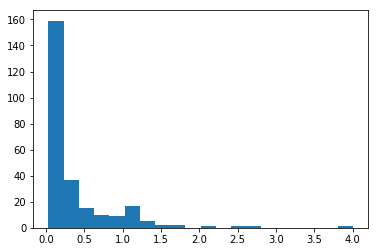

In [211]:
import matplotlib.pyplot as plt
error = abs(price_-google_)
# arr=[0]*(max(error)+1)
# for i in error:
#     arr[i]+=1
    
plt.hist(error,bins=20)
# plt.plot(arr)
plt.show()

In [219]:
effect = np.c_[price,bitcoin]
effect.shape

(260, 2)

In [220]:
import statsmodels.api as sm
sm.tsa.stattools.grangercausalitytests(effect,maxlag=1)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.3494 , p=0.0001  , df_denom=256, df_num=1
ssr based chi2 test:   chi2=16.5410 , p=0.0000  , df=1
likelihood ratio test: chi2=16.0343 , p=0.0001  , df=1
parameter F test:         F=16.3494 , p=0.0001  , df_denom=256, df_num=1


{1: ({'ssr_ftest': (16.34942248526439, 6.974344488186617e-05, 256.0, 1),
   'ssr_chi2test': (16.541017280013584, 4.760897774376486e-05, 1),
   'lrtest': (16.034285664870367, 6.220575244749627e-05, 1),
   'params_ftest': (16.34942248526437, 6.974344488186617e-05, 256.0, 1.0)},
   array([[0., 1., 0.]])])}

In [57]:
f=open('outputData2.txt', 'w')
for i in range(np.shape(week)[0]):
#     if(i%7==0):
    f.write(str(week[i])+','+str(price[i])+','+str(bitcoin[i])+','+'\n')
#     break
f.close()

In [228]:
file = pd.read_excel('originalData3.xlsx')
file.head()
file.keys()

Index(['transaction', 'nodes', 'year', 'month', 'BTC/USD'], dtype='object')

In [229]:
transactions = file['transaction']
nodes = file['nodes']
year=file['year']
month = file['month']
btc = file['BTC/USD']
print(np.shape(nodes))

(17,)


In [232]:
effect1=np.c_[btc,transactions]
sm.tsa.stattools.grangercausalitytests(effect1,maxlag=1)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4382  , p=0.2518  , df_denom=13, df_num=1
ssr based chi2 test:   chi2=1.7702  , p=0.1834  , df=1
likelihood ratio test: chi2=1.6789  , p=0.1951  , df=1
parameter F test:         F=1.4382  , p=0.2518  , df_denom=13, df_num=1


{1: ({'ssr_ftest': (1.438249569785737, 0.2518256303018121, 13.0, 1),
   'ssr_chi2test': (1.7701533166593686, 0.1833631060333374, 1),
   'lrtest': (1.678904763621233, 0.19507004724044225, 1),
   'params_ftest': (1.4382495699386362, 0.25182563027787597, 13.0, 1.0)},
   array([[0., 1., 0.]])])}

In [234]:
sm.tsa.stattools.grangercausalitytests(np.c_[btc,nodes],maxlag=1)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4793  , p=0.2455  , df_denom=13, df_num=1
ssr based chi2 test:   chi2=1.8207  , p=0.1772  , df=1
likelihood ratio test: chi2=1.7243  , p=0.1891  , df=1
parameter F test:         F=1.4793  , p=0.2455  , df_denom=13, df_num=1


{1: ({'ssr_ftest': (1.479300473362527, 0.2455072321080059, 13.0, 1),
   'ssr_chi2test': (1.8206775056769564, 0.17723265256144494, 1),
   'lrtest': (1.724331495654738, 0.1891364398322271, 1),
   'params_ftest': (1.4793004734018025, 0.24550723210206224, 13.0, 1.0)},
   array([[0., 1., 0.]])])}

In [235]:
sm.tsa.stattools.grangercausalitytests(np.c_[transactions,nodes],maxlag=1)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.3374  , p=0.0179  , df_denom=13, df_num=1
ssr based chi2 test:   chi2=9.0306  , p=0.0027  , df=1
likelihood ratio test: chi2=7.1602  , p=0.0075  , df=1
parameter F test:         F=7.3374  , p=0.0179  , df_denom=13, df_num=1


{1: ({'ssr_ftest': (7.337372980736743, 0.0178925832060071, 13.0, 1),
   'ssr_chi2test': (9.030612899368299, 0.002654954504860335, 1),
   'lrtest': (7.160173911918946, 0.0074539969281273615, 1),
   'params_ftest': (7.337372983053746, 0.017892583191410145, 13.0, 1.0)},
   array([[0., 1., 0.]])])}

In [194]:
transactions[:2]

0    21652
1    27572
Name: edges, dtype: object

In [195]:
btc[:2]

0    0.06785
1    0.06000
Name: BTC/USD, dtype: float64

In [ ]:
G=nx.read_graphml('2011_5.graphml')

In [11]:
G.number_of_nodes()

502030

In [12]:
G.number_of_edges()

975407

In [13]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=4)
# kmeans.fit(X)

In [14]:
from networkx.algorithms.cluster import clustering


In [16]:
G.in_degree()

InDegreeView({'17afxUJouat3fkaaQ9tZrDThxdkXGL4WrM': 0, '12higDjoCCNXSA95xZMWUdPvXNmkAduhWv': 2, '1GtkM4wviwohP192tec9g83hd9X5qtbk9j': 0, '1AbHNFdKJeVL8FRZyRZoiTzG9VCmzLrtvm': 1, '1CHE5JRfc5mr8ZtVUP7nnsS5HC4bWcXoc6': 1, '1PZwWEJe5YGx9bzJbEpgXiWLuWnyD2rjLA': 10, '198aMn6ZYAczwrE5NvNTUMyJ5qkfy4g3Hi': 0, '18jANvQ6AuVGJnea4EhmXiAf6bHR5qKjPB': 0, '1PhUXucRd8FzQved2KGK3g1eKfTHPGjgFu': 0, '1JuEjh9znXwqsy5RrnKqgzqY4Ldg7rnj5n': 1, '1PggUtDMmJNwDnCnhAH2pg7ZTiZtMvB4Dg': 0, '1NAauy83Upy9yYv5zjcjk4hwPRJWnzvX52': 0, '1Cpd6ijLsakiAVTRqegjJyhXe61KYjy4ro': 1, '1MjJkkBtL8TTQDQ8TNULe99xwWhz214YhS': 0, '17sbu8Z9FG9PoyqrgTdQzR8yg3SW8U7Hfv': 0, '1GicJdJjH8QSurn7XxGDkBGg5DooSbcTF3': 1, '1KmbtLXBkD7qDM1ksc7sEa7WfsdHwkFtWH': 0, '1As5cFDjhfNmqCw7EQVDF7KBYNKpGeSrnf': 2, '1EWbQNeNNiZcZyJcfQ6CQbnptHiU9pvVYr': 15, '1E2Xxn1s8huuczQKmAgqNR1jTZzq4wx9c8': 0, '1NithGmSgUGQdsYg8gH8WEYtk1ZLxyJBDt': 1, '1GZ274NgVCafuwK1LrnAirzKGt4FxENEqK': 0, '1EG2ZcVyT8JtGgAchrz8tHmXJMu9QPPUM4': 0, '1ByKUypsA6yoR98RcEQitqhDuD5j9gRM1E': 0, 

In [ ]:
# kmeans.fit()

clustering(G, nodes=None, weight=None)